# Segmenting and Clustering Neighborhoods in Toronto
## Question 1 - Toronto neighborhood dataframe

In [1]:

# library to handle data in a vectorized manner
import numpy as np
# library for data analsysis
import pandas as pd

# library to handle JSON files
import json
print('numpy, pandas, ..., imported...')

# library to handle requests
import requests
print('requests imported...')

# tranform JSON file into a pandas dataframe
from pandas.io.json import json_normalize
print('json_normalize imported...')

# Matplotlib and associated plotting modules
import matplotlib.pyplot as plt
print('matplotlib imported...')

# import k-means from clustering stage
from sklearn.cluster import KMeans
print('Kmeans imported...')


numpy, pandas, ..., imported...
requests imported...
json_normalize imported...
matplotlib imported...
Kmeans imported...


In [2]:
# Get the Toronto file from WIKI.
dfs = pd. read_html('https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M')
df = dfs[0]
df.head(10)

,Postal code,Borough,Neighborhood
0,M1A,Not assigned,NaN
1,M2A,Not assigned,NaN
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,Regent Park / Harbourfront
5,M6A,North York,Lawrence Manor / Lawrence Heights
6,M7A,Downtown Toronto,Queen's Park / Ontario Provincial Government
7,M8A,Not assigned,NaN
8,M9A,Etobicoke,Islington Avenue
9,M1B,Scarborough,Malvern / Rouge


In [3]:
df.shape

(180, 3)

In [4]:
# Ignore cells with a borough that is Not assigned.
df1 = df[df.Borough != "Not assigned"]
df1.shape

(103, 3)

In [5]:
df1.head(10)

,Postal code,Borough,Neighborhood
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,Regent Park / Harbourfront
5,M6A,North York,Lawrence Manor / Lawrence Heights
6,M7A,Downtown Toronto,Queen's Park / Ontario Provincial Government
8,M9A,Etobicoke,Islington Avenue
9,M1B,Scarborough,Malvern / Rouge
11,M3B,North York,Don Mills
12,M4B,East York,Parkview Hill / Woodbine Gardens
13,M5B,Downtown Toronto,"Garden District, Ryerson"


In [6]:
# Combine 2 rows with the same Borough. 
# Check if there are postal codes which are listed more than once. 
df1["Postal code"].value_counts()

M1M    1
M9L    1
M5G    1
M1S    1
M8X    1
M4Y    1
M1C    1
M6E    1
M5J    1
M9M    1
M4P    1
M4K    1
M1J    1
M6R    1
M9V    1
M5B    1
M2K    1
M9R    1
M5W    1
M4E    1
M1W    1
M8Z    1
M5K    1
M2R    1
M5T    1
M4B    1
M5A    1
M2M    1
M5E    1
M4S    1
      ..
M4W    1
M1N    1
M1T    1
M6P    1
M5R    1
M2P    1
M6B    1
M4X    1
M3M    1
M6C    1
M7Y    1
M3N    1
M9A    1
M3B    1
M1B    1
M5N    1
M7A    1
M4R    1
M1X    1
M3C    1
M6L    1
M5M    1
M4C    1
M3J    1
M4H    1
M4N    1
M8Y    1
M5C    1
M3A    1
M9N    1
Name: Postal code, Length: 103, dtype: int64

In [7]:
# Make sure that the Neighborhood has the same name with the Borough when the Borough is called 'Not assigned'
# Check if there are Boroughs which have not been assigned names
a= df1.Borough == 'Not assigned'
print (a.sum())

0


In [8]:
# Replace forward slashes in column "Neighborhood" by comma. 
df3 = df1["Neighborhood"].str.replace("/", ",")
df3.head(10)

2                                        Parkwoods
3                                 Victoria Village
4                       Regent Park , Harbourfront
5                Lawrence Manor , Lawrence Heights
6     Queen's Park , Ontario Provincial Government
8                                 Islington Avenue
9                                  Malvern , Rouge
11                                       Don Mills
12                Parkview Hill , Woodbine Gardens
13                        Garden District, Ryerson
Name: Neighborhood, dtype: object

In [9]:
# Bring new column back to df1
df1['Neighborhood'] = df3.values

df1.head()

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


,Postal code,Borough,Neighborhood
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,"Regent Park , Harbourfront"
5,M6A,North York,"Lawrence Manor , Lawrence Heights"
6,M7A,Downtown Toronto,"Queen's Park , Ontario Provincial Government"


## Question 2 - Toronto neighborhood Latitude and Longitude

In [11]:
# Use the given url for latitudes and longitudes
df_L = pd.read_csv('http://cocl.us/Geospatial_data')
df_L.head(20)

,Postal Code,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476
5,M1J,43.744734,-79.239476
6,M1K,43.727929,-79.262029
7,M1L,43.711112,-79.284577
8,M1M,43.716316,-79.239476
9,M1N,43.692657,-79.264848


In [12]:
df_L.shape

(103, 3)

In [13]:
# Make sure that the column name is the same with the df1 in preparation for merging
df_L.rename(columns={"Postal Code": "Postal code"},inplace= True)
df_L.head()

,Postal code,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476


In [14]:
# Make sure it's the same datatype
df_L.dtypes
df1.dtypes

Postal code     object
Borough         object
Neighborhood    object
dtype: object

In [15]:
# Merge the names and the coordinates
df_m = pd.merge(df1, df_L, how='left', left_on = 'Postal code', right_on = 'Postal code')
df_m.head(10)

,Postal code,Borough,Neighborhood,Latitude,Longitude
0,M3A,North York,Parkwoods,43.753259,-79.329656
1,M4A,North York,Victoria Village,43.725882,-79.315572
2,M5A,Downtown Toronto,"Regent Park , Harbourfront",43.654260,-79.360636
3,M6A,North York,"Lawrence Manor , Lawrence Heights",43.718518,-79.464763
4,M7A,Downtown Toronto,"Queen's Park , Ontario Provincial Government",43.662301,-79.389494
5,M9A,Etobicoke,Islington Avenue,43.667856,-79.532242
6,M1B,Scarborough,"Malvern , Rouge",43.806686,-79.194353
7,M3B,North York,Don Mills,43.745906,-79.352188
8,M4B,East York,"Parkview Hill , Woodbine Gardens",43.706397,-79.309937
9,M5B,Downtown Toronto,"Garden District, Ryerson",43.657162,-79.378937


In [20]:
# Get Boroughs with "Toronto" in their names to reduce size
df_T=df_m[df_m['Borough'].str.contains("Toronto")].reset_index(drop=True)
df_T.head(3)

,Postal code,Borough,Neighborhood,Latitude,Longitude
0,M5A,Downtown Toronto,"Regent Park , Harbourfront",43.654260,-79.360636
1,M7A,Downtown Toronto,"Queen's Park , Ontario Provincial Government",43.662301,-79.389494
2,M5B,Downtown Toronto,"Garden District, Ryerson",43.657162,-79.378937


In [18]:
df_T.shape

(39, 5)

## Question 3 - Clustering

In [19]:
# Check the df_T 
neighborhood_name = df_T.loc[0, 'Neighborhood']
print(f"The first neighborhood's name is '{neighborhood_name}'.")

The first neighborhood's name is 'Regent Park , Harbourfront'.


In [21]:
# Select first neighborhood before looping 
neighborhood_name = df_T.loc[0, "Neighborhood"]
neighborhood_latitude = df_T.loc[0, "Latitude"] 
neighborhood_longitude = df_T.loc[0, "Longitude"] 
# limit of number of venues returned by Foursquare API
LIMIT = 100 
radius = 500
VERSION = "20200418"
print('Latitude and longitude values of {} are {}, {}.'.format(neighborhood_name, 
                                                               neighborhood_latitude, 
                                                               neighborhood_longitude))

Latitude and longitude values of Regent Park , Harbourfront are 43.6542599, -79.3606359.


In [23]:
# Set up Foursqaure

CLIENT_ID = 'P03R0WOKJKA1ZTXCYDQ05ASLN0ELZQWIJ3DTSD0DRYJHJRCR' # your Foursquare ID
CLIENT_SECRET = 'LLEPOZTQ4C5HF4JDLRAPF3MHABRGHZ2UWUFYUCRN0RGHA3GS' # your Foursquare Secret

url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neighborhood_latitude, 
    neighborhood_longitude, 
    radius, 
    LIMIT)

In [24]:
# Get the result to a json file
results = requests.get(url).json()

In [25]:
# Extract names of the categories

def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [28]:
# Get the data from the json file
venues = results['response']['groups'][0]['items']
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean column names
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues

,name,categories
0,Roselle Desserts,Bakery
1,Tandem Coffee,Coffee Shop
2,Cooper Koo Family YMCA,Distribution Center
3,Body Blitz Spa East,Spa
4,Morning Glory Cafe,Breakfast Spot
5,Impact Kitchen,Restaurant
6,Corktown Common,Park
7,Figs Breakfast & Lunch,Breakfast Spot
8,The Distillery Historic District,Historic Site
9,Dominion Pub and Kitchen,Pub


In [30]:
# Set up the loop which will go through the whole df_T
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    venues_list=[]
    
    for name, lat, lng in zip(names, latitudes, longitudes):
  
        # print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'],  
            v['venue']['categories'][0]['name']) 
            for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue',
                  'Venue Category'
                            ]
    
    return(nearby_venues)

In [31]:
# Fill in the df_T data
Toronto_denc_venues = getNearbyVenues(names=df_T['Neighborhood'],
                                   latitudes=df_T['Latitude'],
                                   longitudes=df_T['Longitude']
                                  )

In [32]:
Toronto_denc_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Category
0,"Regent Park , Harbourfront",43.65426,-79.360636,Roselle Desserts,Bakery
1,"Regent Park , Harbourfront",43.65426,-79.360636,Tandem Coffee,Coffee Shop
2,"Regent Park , Harbourfront",43.65426,-79.360636,Cooper Koo Family YMCA,Distribution Center
3,"Regent Park , Harbourfront",43.65426,-79.360636,Body Blitz Spa East,Spa
4,"Regent Park , Harbourfront",43.65426,-79.360636,Morning Glory Cafe,Breakfast Spot


In [33]:
# See how many venues in each neighborhood
df_p=Toronto_denc_venues.groupby('Neighborhood').count()
df_p

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Category
Neighborhood,,,,
Berczy Park,56,56,56,56
"Brockton , Parkdale Village , Exhibition Place",23,23,23,23
Business reply mail Processing CentrE,14,14,14,14
"CN Tower , King and Spadina , Railway Lands , Harbourfront West , Bathurst Quay , South Niagara , Island airport",18,18,18,18
Central Bay Street,59,59,59,59
Christie,18,18,18,18
Church and Wellesley,73,73,73,73
"Commerce Court , Victoria Hotel",100,100,100,100
Davisville,34,34,34,34


In [34]:
print('There are {} uniques categories.'.format(len(Toronto_denc_venues['Venue Category'].unique())))

There are 228 uniques categories.


In [37]:
# See which area is busiest
df_a= df_p.sort_values(by ='Venue',ascending = False )
df_a.head(20)

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Category
Neighborhood,,,,
"Toronto Dominion Centre , Design Exchange",100,100,100,100
"Commerce Court , Victoria Hotel",100,100,100,100
"First Canadian Place , Underground city",100,100,100,100
"Garden District, Ryerson",100,100,100,100
"Harbourfront East , Union Station , Toronto Islands",100,100,100,100
Stn A PO Boxes,95,95,95,95
"Richmond , Adelaide , King",94,94,94,94
St. James Town,80,80,80,80
Church and Wellesley,73,73,73,73


In [40]:
# one hot encoding to count numbers of categories
Toronto_denc_onehot = pd.get_dummies(Toronto_denc_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
Toronto_denc_onehot['Neighborhood'] = Toronto_denc_venues['Neighborhood'] 

Toronto_denc_onehot.head(3)

,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Art Gallery,...,Theme Restaurant,Toy / Game Store,Trail,Train Station,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Wine Bar,Women's Store,Yoga Studio
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [104]:
cols = list(Toronto_denc_onehot)
# move the column to head of list using index, pop and insert
cols.insert(0, cols.pop(cols.index('Neighborhood')))
cols


# use ix to reorder
Toronto_denc_onehot = Toronto_denc_onehot.ix[:, cols]
Toronto_denc_onehot

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:8: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


,Neighborhood,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Art Gallery,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Stadium,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Line,Butcher,Cable Car,Café,Cajun / Creole Restaurant,Candy Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Gym,College Rec Center,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Harbor / Marina,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Market,Martial Arts Dojo,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Movie Theater,Museum,Music Venue,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Park,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Plane,Playground,Plaza,Poke Place,Poutine Place,Pub,Ramen Restaurant,Record Shop,Rental Car Location,Restaurant,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shoe Repair,Shoe Store,Shopping Mall,Skate Park,Skating Rink,Smoke Shop,Snack Place,Soup Place,South American Restaurant,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Stadium,Stationery Store,Steakhouse,Strip Club,Supermarket,Sushi Restaurant,Swim School,Taco Place,Tailor Shop,Taiwanese Restaurant,Tanning Salon,Tea Room,Thai Restaurant,Theater,Theme Restaurant,Toy / Game Store,Trail,Train Station,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Wine Bar,Women's Store,Yoga Studio
0,"Regent Park , Harbourfront",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,"Regent Park , Harbourfront",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [135]:
# Get the fr
Toronto_denc_grouped = Toronto_denc_onehot.groupby('Neighborhood').mean().reset_index()
Toronto_denc_grouped.head()

,Neighborhood,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Art Gallery,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Stadium,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Line,Butcher,Cable Car,Café,Cajun / Creole Restaurant,Candy Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Gym,College Rec Center,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Harbor / Marina,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Market,Martial Arts Dojo,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Movie Theater,Museum,Music Venue,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Park,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Plane,Playground,Plaza,Poke Place,Poutine Place,Pub,Ramen Restaurant,Record Shop,Rental Car Location,Restaurant,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shoe Repair,Shoe Store,Shopping Mall,Skate Park,Skating Rink,Smoke Shop,Snack Place,Soup Place,South American Restaurant,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Stadium,Stationery Store,Steakhouse,Strip Club,Supermarket,Sushi Restaurant,Swim School,Taco Place,Tailor Shop,Taiwanese Restaurant,Tanning Salon,Tea Room,Thai Restaurant,Theater,Theme Restaurant,Toy / Game Store,Trail,Train Station,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant,Wine Bar,Women's Store,Yoga Studio
0,Berczy Park,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.017857,0.0,0.0,0.0,0.000000,0.017857,0.0,0.017857,0.035714,0.0,0.000000,0.0,0.017857,0.017857,0.0,0.035714,0.0,0.0,0.017857,0.000000,0.0,0.000000,0.0,0.017857,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.017857,0.0,0.035714,0.0,0.0,0.0,0.035714,0.0,0.0,0.0,0.000000,0.0,0.053571,0.053571,0.0,0.0,0.0,0.0,0.0,0.017857,0.000000,0.017857,0.000000,0.017857,0.0,0.017857,0.0,0.0,0.0,0.0,0.000000,0.0,0.017857,0.000000,0.0,0.0,0.0,0.000000,0.0,0.017857,0.0,0.0,0.0,0.000000,0.035714,0.000000,0.0,0.0,0.017857,0.0,0.0,0.0,0.0,0.0,0.017857,0.017857,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.017857,0.017857,0.000000,0.000000,0.000000,0.00

In [136]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    return row_categories_sorted.index.values[0:num_top_venues]

num_top_venues = 10

#indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = Toronto_denc_grouped['Neighborhood']

for ind in np.arange(Toronto_denc_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(Toronto_denc_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Berczy Park,Coffee Shop,Cocktail Bar,Bakery,Cheese Shop,Café,Italian Restaurant,Restaurant,Farmers Market,Beer Bar,Seafood Restaurant
1,"Brockton , Parkdale Village , Exhibition Place",Café,Coffee Shop,Breakfast Spot,Gym,Bakery,Nightclub,Convenience Store,Performing Arts Venue,Pet Store,Climbing Gym
2,Business reply mail Processing CentrE,Light Rail Station,Garden Center,Burrito Place,Auto Workshop,Spa,Fast Food Restaurant,Farmers Market,Garden,Pizza Place,Brewery
3,"CN Tower , King and Spadina , Railway Lands , ...",Airport Service,Airport Lounge,Airport Terminal,Airport,Bar,Coffee Shop,Plane,Rental Car Location,Sculpture Garden,Boat or Ferry
4,Central Bay Street,Coffee Shop,Italian Restaurant,Café,Sandwich Place,Bubble Tea Shop,Salad Place,Burger Joint,Ice Cream Shop,Japanese Restaurant,Middle Eastern Restaurant


In [137]:
data_transformed = Toronto_denc_grouped.set_index('Neighborhood')
Sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(data_transformed)
    Sum_of_squared_distances.append(km.inertia_)

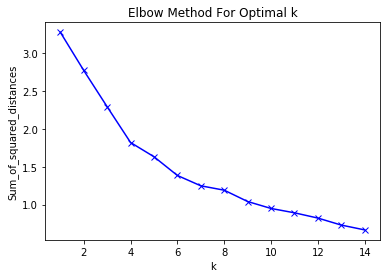

In [138]:
# Import required packages
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [139]:
# set number of clusters
kclusters = 5

Toronto_denc_grouped_clustering = Toronto_denc_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Toronto_denc_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

In [140]:


# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
Toronto_denc_merged = df_T.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

Toronto_denc_merged.head(30) # check the last columns!

,Postal code,Borough,Neighborhood,Latitude,Longitude,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,M5A,Downtown Toronto,"Regent Park , Harbourfront",43.654260,-79.360636,Coffee Shop,Pub,Bakery,Park,Breakfast Spot,Restaurant,Café,Theater,Mexican Restaurant,Shoe Store
1,M7A,Downtown Toronto,"Queen's Park , Ontario Provincial Government",43.662301,-79.389494,Coffee Shop,Diner,Sushi Restaurant,Yoga Studio,Park,Mexican Restaurant,Juice Bar,Italian Restaurant,Hobby Shop,Fried Chicken Joint
2,M5B,Downtown Toronto,"Garden District, Ryerson",43.657162,-79.378937,Coffee Shop,Clothing Store,Café,Japanese Restaurant,Bubble Tea Shop,Cosmetics Shop,Middle Eastern Restaurant,Bookstore,Tea Room,Diner
3,M5C,Downtown Toronto,St. James Town,43.651494,-79.375418,Coffee Shop,Café,Cocktail Bar,Gastropub,Italian Restaurant,American Restaurant,Seafood Restaurant,Farmers Market,Hotel,Department Store
4,M4E,East Toronto,The Beaches,43.676357,-79.293031,Coffee Shop,Health Food Store,Trail,Asian Restaurant,Pub,Yoga Studio,Doner Restaurant,Discount Store,Distribution Center,Dog Run
5,M5E,Downtown Toronto,Berczy Park,43.644771,-79.373306,Coffee Shop,Cocktail Bar,Bakery,Cheese Shop,Café,Italian Restaurant,Restaurant,Farmers Market,Beer Bar,Seafood Restaurant
6,M5G,Downtown Toronto,Central Bay Street,43.657952,-79.387383,Coffee Shop,Italian Restaurant,Café,Sandwich Place,Bubble Tea Shop,Salad Place,Burger Joint,Ice Cream Shop,Japanese Restaurant,Middle Eastern Restaurant
7,M6G,Downtown Toronto,Christie,43.669542,-79.422564,Grocery Store,Café,Park,Baby Store,Gas Station,Candy Store,Italian Restaurant,Athletics & Sports,Restaurant,Diner
8,M5H,Downtown Toronto,"Richmond , Adelaide , King",43.650571,-79.384568,Coffee Shop,Café,Restaurant,Gym,Thai Restaurant,Hotel,American Restaurant,Deli / Bodega,Pizza Place,Sushi Restaurant
9,M6H,West Toronto,"Dufferin , Dovercourt Village",43.669005,-79.442259,Pharmacy,Pizza Place,Bakery,Gym,Middle Eastern Restaurant,Grocery Store,Bar,Gym / Fitness Center,Park,Music Venue


In [141]:
Toronto_denc_merged.loc[Toronto_denc_merged['Cluster Labels'] == 0]

KeyError: 'Cluster Labels'

In [142]:
Toronto_denc_merged.loc[Toronto_denc_merged['Cluster Labels'] == 1]

KeyError: 'Cluster Labels'

In [121]:
Toronto_denc_merged.loc[Toronto_denc_merged['Cluster Labels'] == 2]

,Postal code,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
19,M5N,Central Toronto,Roselawn,43.711695,-79.416936,2,Home Service,Garden,Yoga Studio,Dessert Shop,Event Space,Ethiopian Restaurant,Electronics Store,Eastern European Restaurant,Dumpling Restaurant,Donut Shop


In [122]:
Toronto_denc_merged.loc[Toronto_denc_merged['Cluster Labels'] == 3]

,Postal code,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
29,M4T,Central Toronto,"Moore Park , Summerhill East",43.689574,-79.38316,3,Playground,Restaurant,Yoga Studio,Department Store,Ethiopian Restaurant,Electronics Store,Eastern European Restaurant,Dumpling Restaurant,Donut Shop,Doner Restaurant


In [123]:
Toronto_denc_merged.loc[Toronto_denc_merged['Cluster Labels'] == 4]

,Postal code,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
21,M5P,Central Toronto,Forest Hill North & West,43.696948,-79.411307,4,Jewelry Store,Trail,Mexican Restaurant,Sushi Restaurant,Yoga Studio,Diner,Ethiopian Restaurant,Electronics Store,Eastern European Restaurant,Dumpling Restaurant


In [124]:
Toronto_denc_merged.loc[Toronto_denc_merged['Cluster Labels'] == 5]

,Postal code,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
20,M4P,Central Toronto,Davisville North,43.712751,-79.390197,5,Gym,Department Store,Breakfast Spot,Food & Drink Shop,Sandwich Place,Hotel,Park,Coworking Space,Concert Hall,Ethiopian Restaurant


In [125]:
Toronto_denc_merged.loc[Toronto_denc_merged['Cluster Labels'] == 6]

,Postal code,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
4,M4E,East Toronto,The Beaches,43.676357,-79.293031,6,Coffee Shop,Health Food Store,Trail,Asian Restaurant,Pub,Yoga Studio,Doner Restaurant,Discount Store,Distribution Center,Dog Run


In [ ]:
Toronto_denc_merged.loc[Toronto_denc_merged['Cluster Labels'] == 1]